In [7]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score

df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

Accuracy= 0.6820338983050848
F1-score= 0.669686542152964


In [8]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score

df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
#model_gb.fit(X_train,Y_train)
#print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
#print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
model_rf.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_rf.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_rf.predict(X_test),average='weighted'))


Accuracy= 0.6183050847457627
F1-score= 0.6140927161456826


/home/abhijit/.local/lib/python3.6/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [12]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=45

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6820338983050848
F1-score= 0.669686542152964


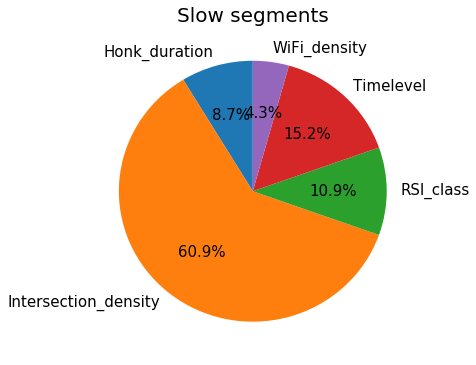

In [27]:
import matplotlib.pyplot as plt
data_value = [0.04,0.28,0.05,0.07,0.02]
sum_1=0.04+0.28+0.05+0.07+0.02
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['Honk_duration','Intersection_density','RSI_class','Timelevel','WiFi_density']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

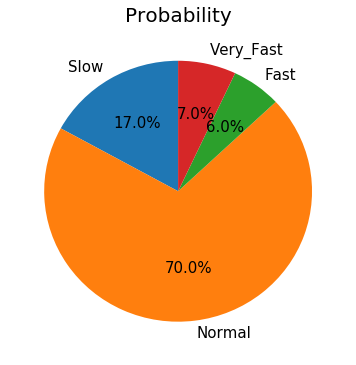

In [28]:
import matplotlib.pyplot as plt
data_value = [0.17,0.70,0.06,0.07]


activities = ['Slow','Normal','Fast','Very_Fast']

plt.figure(figsize=(6,6))
plt.pie(data_value, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Probability',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [13]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=34

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6820338983050848
F1-score= 0.669686542152964


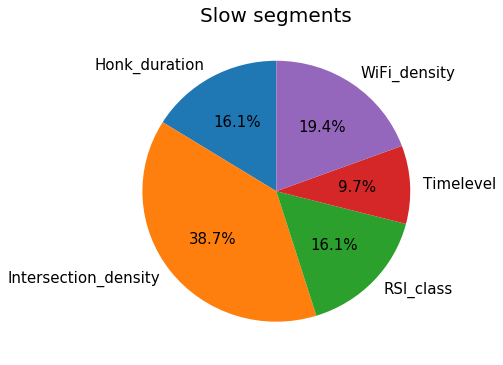

In [29]:
import matplotlib.pyplot as plt
data_value = [0.05,0.12,0.05,0.03,0.06]
sum_1=0.04+0.12+0.05+0.03+0.06
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['Honk_duration','Intersection_density','RSI_class','Timelevel','WiFi_density']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

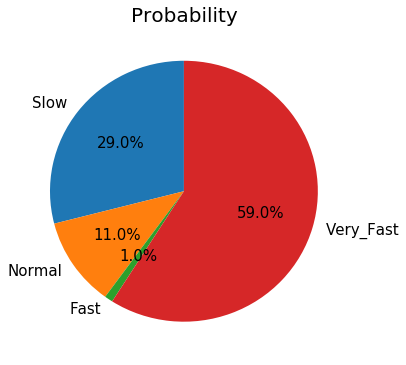

In [30]:
import matplotlib.pyplot as plt
data_value = [0.29,0.11,0.01,0.59]


activities = ['Slow','Normal','Fast','Very_Fast']

plt.figure(figsize=(6,6))
plt.pie(data_value, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Probability',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [14]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=3

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6820338983050848
F1-score= 0.669686542152964


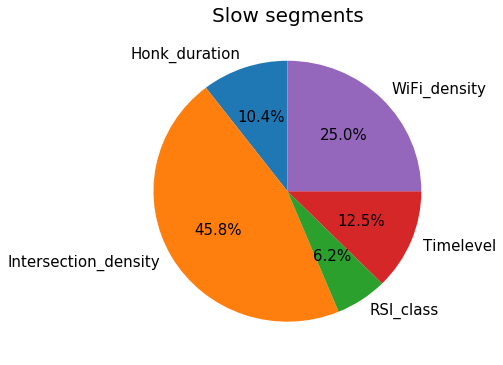

In [31]:
import matplotlib.pyplot as plt
data_value = [0.05,0.22,0.03,0.06,0.12]
sum_1=0.05+0.22+0.03+0.06+0.12
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['Honk_duration','Intersection_density','RSI_class','Timelevel','WiFi_density']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

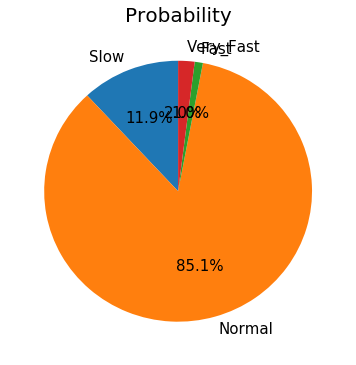

In [32]:
import matplotlib.pyplot as plt
data_value = [0.12,0.86,0.01,0.02]


activities = ['Slow','Normal','Fast','Very_Fast']

plt.figure(figsize=(6,6))
plt.pie(data_value, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Probability',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [16]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()

model_rf=RandomForestClassifier()
model_rf.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_rf.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_rf.predict(X_test),average='weighted'))
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=45

exp = explainer.explain_instance(X_test[observation_1], predict_fn_rf, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6386440677966102
F1-score= 0.632042048364158


/home/abhijit/.local/lib/python3.6/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


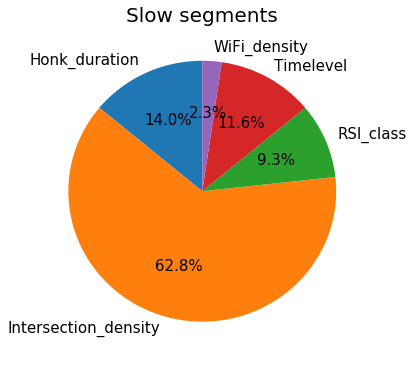

In [33]:
import matplotlib.pyplot as plt
data_value = [0.06,0.27,0.04,0.05,0.01]
sum_1=0.06+0.27+0.04+0.05+0.01
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['Honk_duration','Intersection_density','RSI_class','Timelevel','WiFi_density']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [17]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()

model_rf=RandomForestClassifier()
model_rf.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_rf.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_rf.predict(X_test),average='weighted'))
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=34

exp = explainer.explain_instance(X_test[observation_1], predict_fn_rf, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6284745762711864
F1-score= 0.6243287344623633


/home/abhijit/.local/lib/python3.6/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


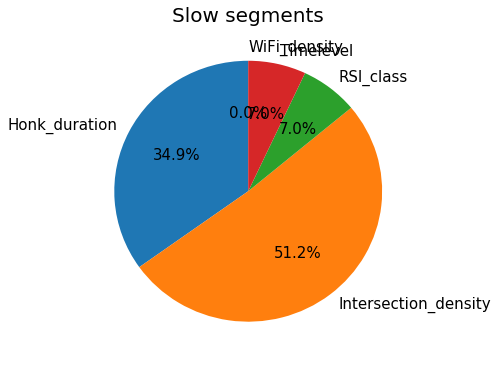

In [35]:
import matplotlib.pyplot as plt
data_value = [0.15,0.22,0.03,0.03,0.0]
sum_1=0.15+0.22+0.03+0.03+0.0
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['Honk_duration','Intersection_density','RSI_class','Timelevel','WiFi_density']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [18]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()

model_rf=RandomForestClassifier()
model_rf.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_rf.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_rf.predict(X_test),average='weighted'))
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=3

exp = explainer.explain_instance(X_test[observation_1], predict_fn_rf, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6183050847457627
F1-score= 0.6138706599839748


/home/abhijit/.local/lib/python3.6/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


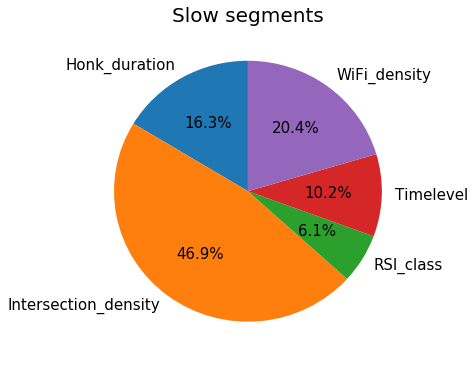

In [37]:
import matplotlib.pyplot as plt
data_value = [0.08,0.23,0.03,0.05,0.10]
sum_1=0.08+0.23+0.03+0.05+0.10
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['Honk_duration','Intersection_density','RSI_class','Timelevel','WiFi_density']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [36]:
print("h")

h


In [19]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=66

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6820338983050848
F1-score= 0.669686542152964


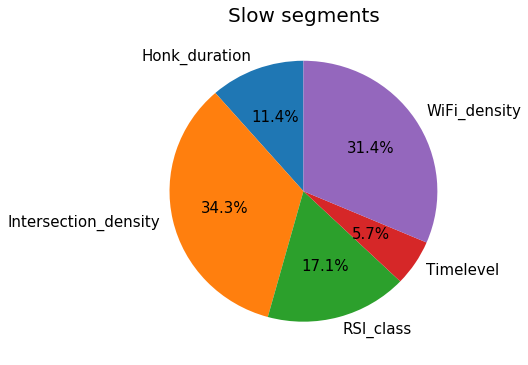

In [38]:
import matplotlib.pyplot as plt
data_value = [0.04,0.12,0.06,0.02,0.11]
sum_1=0.04+0.12+0.06+0.02+0.11
data_f=[]
for item in data_value:
    k=(1/sum_1)*item
    data_f.append(k)
    
activities = ['Honk_duration','Intersection_density','RSI_class','Timelevel','WiFi_density']

plt.figure(figsize=(6,6))
plt.pie(data_f, labels=activities,startangle=90, autopct='%.1f%%',textprops={'fontsize': 15})
plt.title('Slow segments',fontsize=20)
# plt.legend(labels=activities,loc=2,fontsize=15)
plt.show()

In [20]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=61

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6820338983050848
F1-score= 0.669686542152964


In [21]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=77

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6820338983050848
F1-score= 0.669686542152964


In [22]:
from __future__ import print_function

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
import lime
import lime.lime_tabular
df1=pd.read_csv('train.csv')
df2=pd.read_csv('test.csv')

X=df1[['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']].values
Y=df1['Class'].values

classes=['Fast','Normal','Slow','Very Fast']
features=['WiFi density','RSI class','Honk_duration','Timelevel','Intersection density']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,random_state=42, test_size=0.3)

model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,Y_train)
print("Accuracy=",accuracy_score(Y_test, model_gb.predict(X_test)))
print("F1-score=",f1_score(Y_test, model_gb.predict(X_test),average='weighted'))
model_rf=RandomForestClassifier()
#model_xgb=XBGClassifier()

predict_fn_rf= lambda x: model_rf.predict_proba(x).astype(float)
predict_fn_gb= lambda x: model_gb.predict_proba(x).astype(float)

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,mode='classification',feature_selection= 'auto',
                                                   class_names=classes,feature_names = features, 
                                                   kernel_width=None,discretize_continuous=True)
observation_1=1

exp = explainer.explain_instance(X_test[observation_1], predict_fn_gb, num_features=5,top_labels=1)
exp.show_in_notebook(show_all=False)



Accuracy= 0.6820338983050848
F1-score= 0.669686542152964
